## Импорт библиотек

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import GridSearchCV
%matplotlib inline 
sns.set(style="ticks")

import country_converter as coco

## Загрузка данных

In [2]:
original_dataset = pd.read_csv('../worldcitiespop.csv', sep=",", low_memory=False)

## Основные характеристики датасета

In [3]:
original_dataset.head()

,Country,City,AccentCity,Region,Population,Latitude,Longitude
0,ad,aixas,Aixàs,06,NaN,42.483333,1.466667
1,ad,aixirivali,Aixirivali,06,NaN,42.466667,1.500000
2,ad,aixirivall,Aixirivall,06,NaN,42.466667,1.500000
3,ad,aixirvall,Aixirvall,06,NaN,42.466667,1.500000
4,ad,aixovall,Aixovall,06,NaN,42.466667,1.483333


In [4]:
original_dataset.shape

(3173958, 7)

In [5]:
original_dataset.columns

Index(['Country', 'City', 'AccentCity', 'Region', 'Population', 'Latitude',
       'Longitude'],
      dtype='object')

In [6]:
original_dataset.dtypes

Country        object
City           object
AccentCity     object
Region         object
Population    float64
Latitude      float64
Longitude     float64
dtype: object

## Кодирование категориальных признаков

In [7]:
enc = LabelEncoder()
original_dataset["Country_encoded"] = enc.fit_transform(original_dataset["Country"])

## Обработка пропусков данных

In [8]:
original_dataset.isnull().sum()

Country                  0
City                     6
AccentCity               0
Region                   8
Population         3125978
Latitude                 0
Longitude                0
Country_encoded          0
dtype: int64

In [9]:
cleansed_dataset = original_dataset.drop("Population", axis=1).dropna()
cleansed_dataset.isnull().sum()

Country            0
City               0
AccentCity         0
Region             0
Latitude           0
Longitude          0
Country_encoded    0
dtype: int64

## Именьшение размера выборки

In [10]:
reduced_dataset = cleansed_dataset.sample(n=20000, random_state=10)
reduced_dataset.shape

(20000, 7)

In [11]:
cleansed_dataset['Country'].nunique(), reduced_dataset['Country'].nunique()

(234, 197)

In [12]:
missed_countries = list(set(cleansed_dataset.Country.unique()) - set(reduced_dataset.Country.unique()))
coco.convert(names=missed_countries, to="name_short")

['Guernsey',
 'Tonga',
 'St. Helena',
 'Cook Islands',
 'Svalbard and Jan Mayen Islands',
 'Gibraltar',
 'Antigua and Barbuda',
 'French Southern Territories',
 'Bermuda',
 'Samoa',
 'Kiribati',
 'Pitcairn',
 'Turks and Caicos Islands',
 'St. Pierre and Miquelon',
 'Christmas Island',
 'Monaco',
 'South Georgia and South Sandwich Is.',
 'Marshall Islands',
 'Liechtenstein',
 'St. Lucia',
 'Wallis and Futuna Islands',
 'United States Virgin Islands',
 'San Marino',
 'Tokelau',
 'Jersey',
 'Sao Tome and Principe',
 'Montserrat',
 'Dominica',
 'Seychelles',
 'Norfolk Island',
 'Maldives',
 'British Virgin Islands',
 'Cocos (Keeling) Islands',
 'Cayman Islands',
 'St. Kitts and Nevis',
 'Macau',
 'Mayotte']

## Построение графиков

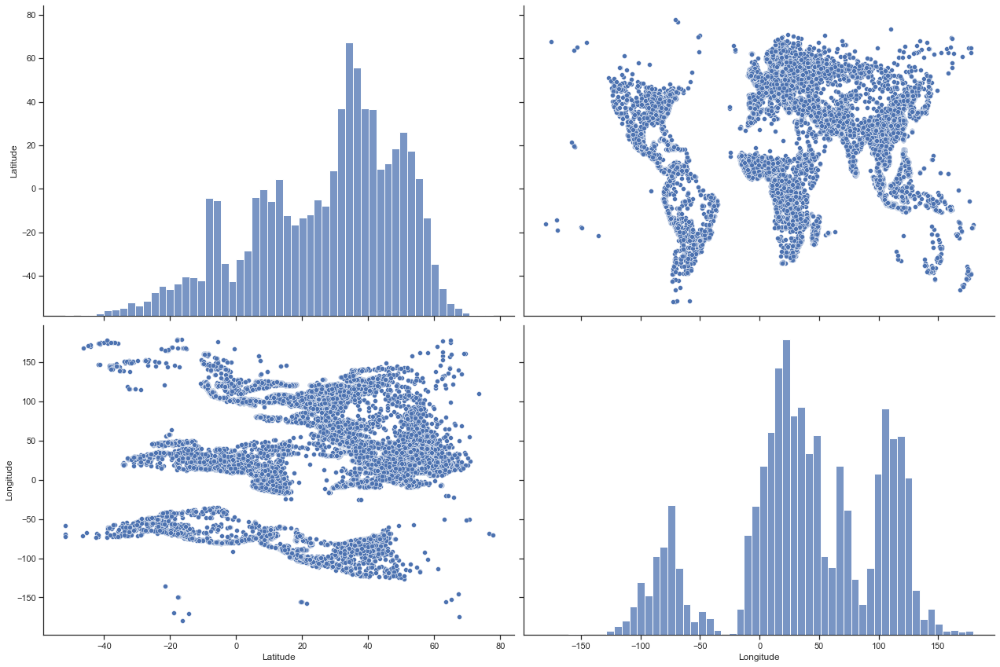

In [13]:
# Парные диаграммы
sns.pairplot(reduced_dataset.drop("Country_encoded", axis=1), height=6, aspect=1.5)

<AxesSubplot:xlabel='Longitude', ylabel='Latitude'>

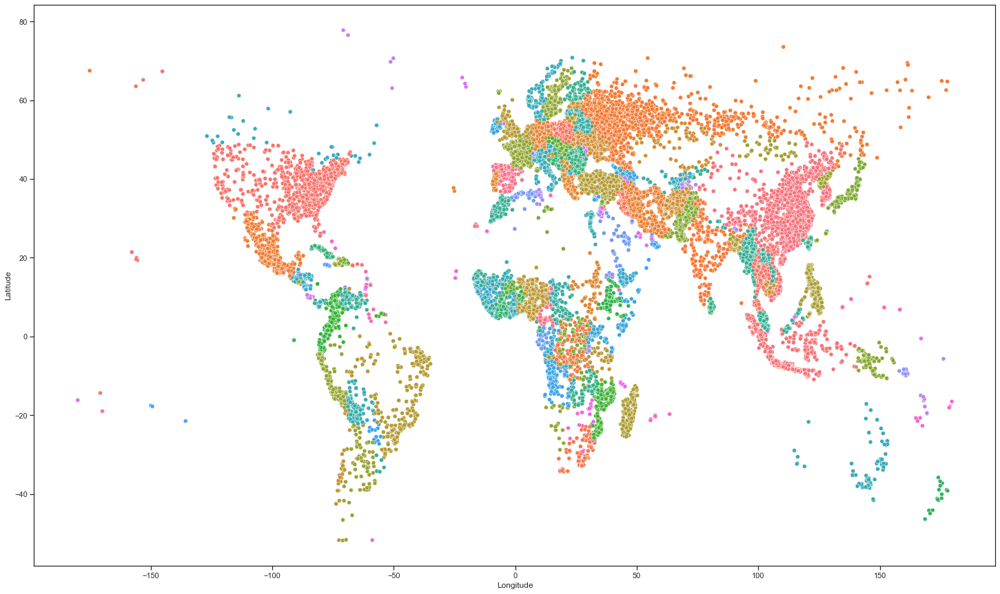

In [14]:
fig, ax = plt.subplots(figsize=(25,15))
sns.scatterplot(ax=ax, x='Longitude', y='Latitude', hue="Country", data=reduced_dataset, legend=False)

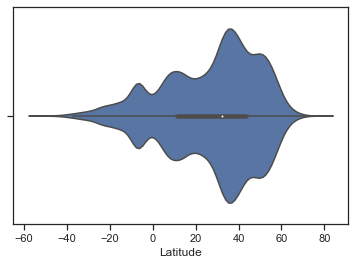

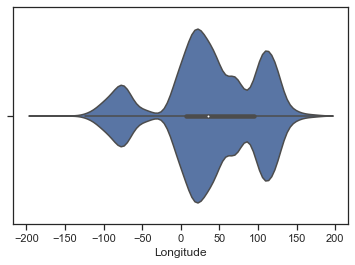

In [15]:
for col in ["Latitude", "Longitude"]:
    sns.violinplot(x=reduced_dataset[col])
    plt.show()

## Разбиение выборки на обучающую и тестовою

In [17]:
X = reduced_dataset[["Latitude", "Longitude"]]
Y = reduced_dataset["Country_encoded"]
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=10)
X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

((14000, 2), (6000, 2), (14000,), (6000,))

In [16]:
class MetricLogger:
    
    def __init__(self):
        self.df = pd.DataFrame(
            {'metric': pd.Series([], dtype='str'),
            'alg': pd.Series([], dtype='str'),
            'value': pd.Series([], dtype='float')})

    def add(self, metric, alg, value):
        """
        Добавление значения
        """
        # Удаление значения если оно уже было ранее добавлено
        self.df.drop(self.df[(self.df['metric']==metric)&(self.df['alg']==alg)].index, inplace = True)
        # Добавление нового значения
        temp = [{'metric':metric, 'alg':alg, 'value':value}]
        self.df = self.df.append(temp, ignore_index=True)

    def get_data_for_metric(self, metric, ascending=True):
        """
        Формирование данных с фильтром по метрике
        """
        temp_data = self.df[self.df['metric']==metric]
        temp_data_2 = temp_data.sort_values(by='value', ascending=ascending)
        return temp_data_2['alg'].values, temp_data_2['value'].values
    
    def plot(self, str_header, metric, ascending=True, figsize=(5, 5)):
        """
        Вывод графика
        """
        array_labels, array_metric = self.get_data_for_metric(metric, ascending)
        fig, ax1 = plt.subplots(figsize=figsize)
        pos = np.arange(len(array_metric))
        rects = ax1.barh(pos, array_metric, align='center', height=0.5, tick_label=array_labels)
        ax1.set_title(str_header)
        for a,b in zip(pos, array_metric):
            plt.text(0.5, a-0.05, str(round(b,3)), color='white')
        plt.show()    

In [20]:
def clas_train_model(model_name, model, clasMetricLogger):
    model.fit(X_train, Y_train)
    Y_pred = model.predict(X_test)
    
    precision = precision_score(Y_test.values, Y_pred, average="weighted", zero_division=0)
    recall = recall_score(Y_test.values, Y_pred, average="weighted", zero_division=0)
    f1 = f1_score(Y_test.values, Y_pred, average="weighted")

    clasMetricLogger.add('precision', model_name, precision)
    clasMetricLogger.add('recall', model_name, recall)
    clasMetricLogger.add('f1', model_name, f1)
    
    print('{} \t precision={}, recall={}, f1={}'.format(
        model_name, round(precision, 5), round(recall, 5), round(f1, 5)))

## Выбор моделей для задачи классификации

In [18]:
# Сохранение метрик
clasMetricLogger = MetricLogger()
# Модели
clas_models = {
    'Nearest Neighbors':KNeighborsClassifier(n_neighbors=5),
    'C-Support Vector': SVC(),
    'Desicion Tree  ':DecisionTreeClassifier(),
    'Random Forest  ':RandomForestClassifier(),
    'Bagging        ':BaggingClassifier(random_state=10)
    }

## Обучение моделей

In [21]:
for model_name, model in clas_models.items():
    clas_train_model(model_name, model, clasMetricLogger)

Nearest Neighbors 	 precision=0.93696, recall=0.93917, f1=0.9361
C-Support Vector 	 precision=0.59028, recall=0.70467, f1=0.62443
Desicion Tree   	 precision=0.94228, recall=0.93933, f1=0.93865
Random Forest   	 precision=0.94857, recall=0.94833, f1=0.94666
Bagging         	 precision=0.94417, recall=0.943, f1=0.94164


## Подбор гиперпараметра для модели K ближайших соседей

In [23]:
n_range_list = list(range(0,50))
n_range_list[0] = 1
tuned_parameters = {'n_neighbors': np.array(n_range_list)}
tuned_parameters

{'n_neighbors': array([ 1,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49])}

In [24]:
%%time
clf_gs = GridSearchCV(KNeighborsClassifier(), tuned_parameters, scoring='f1_weighted')
clf_gs.fit(X_train, Y_train)

C:\Users\axali\AppData\Local\Programs\Python\Python38-32\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
Wall time: 25.2 s


GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([ 1,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49])},
             scoring='f1_weighted')

In [25]:
# Лучшая модель
clf_gs.best_estimator_

KNeighborsClassifier(n_neighbors=1)

In [26]:
clf_gs_best_params_txt = str(clf_gs.best_params_['n_neighbors'])
clf_gs_best_params_txt

'1'

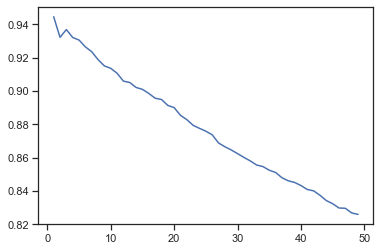

In [27]:
# Изменение качества на тестовой выборке в зависимости от К-соседей
plt.plot(n_range_list, clf_gs.cv_results_['mean_test_score'])

## Сравнение модели K ближайших соседей со старыми и новыми гиперпараметрами

In [28]:
clf_models_grid = {'Nearest Neighbors (старые гиперпараметры)': KNeighborsClassifier(n_neighbors=5), 
                    'Nearest Neighbors (новые гиперпараметры)': clf_gs.best_estimator_}

In [29]:
for model_name, model in clf_models_grid.items():
    clas_train_model(model_name, model, clasMetricLogger)

Nearest Neighbors (старые гиперпараметры) 	 precision=0.93696, recall=0.93917, f1=0.9361
Nearest Neighbors (новые гиперпараметры) 	 precision=0.9519, recall=0.94983, f1=0.94962


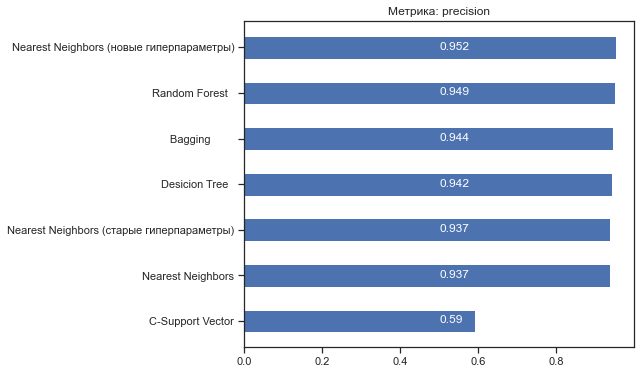

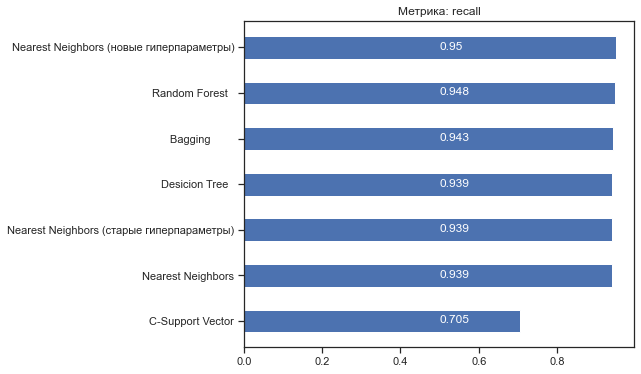

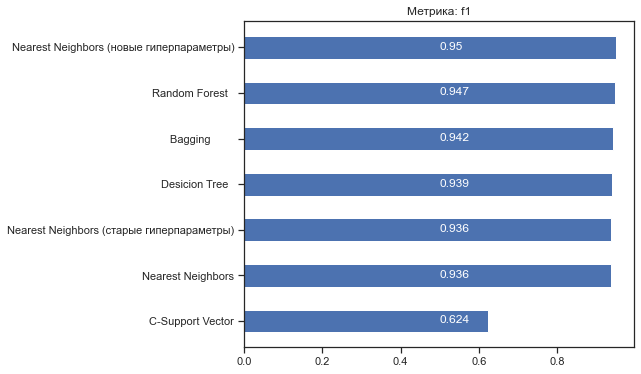

In [30]:
# Построим графики метрик качества модели
clas_metrics = clasMetricLogger.df['metric'].unique()
for metric in clas_metrics:
    clasMetricLogger.plot('Метрика: ' + metric, metric, figsize=(7, 6))

In [31]:
best_predict = clf_gs.best_estimator_.predict(X_test)
missed_countries_ = list(set(reduced_dataset["Country_encoded"]) - set(best_predict))
coco.convert(names=enc.inverse_transform(missed_countries_), to="name_short")

an not found in ISO2


['Anguilla',
 'not found',
 'Aruba',
 'Mauritania',
 'Bahamas',
 'Nauru',
 'Niue',
 'Belize',
 'French Polynesia',
 'Qatar',
 'Djibouti',
 'Western Sahara',
 'Falkland Islands',
 'Micronesia, Fed. Sts.',
 'Suriname',
 'Eswatini',
 'French Guiana',
 'Guadeloupe',
 'Tuvalu',
 'Guyana',
 'St. Vincent and the Grenadines',
 'Isle of Man',
 'Kuwait',
 'Lesotho']

In [31]:
for model_name, model in clas_models.items():
    prediction = model.predict([[20, 20]])
    print(f'{model_name}: {coco.convert(names=enc.inverse_transform(prediction), to="name_short")}')

Nearest Neighbors: Chad
C-Support Vector: Chad
Desicion Tree  : Libya
Random Forest  : Libya
Bagging        : Libya
